In [1]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd

import scanpy as sc
import scipy as sp

import sys
import os
sys.path.append(os.path.abspath("./utility_functions"))

import rz_functions as rz
import ng_functions as ng
import rz_utility_spring as srz

from time import time
from seaborn import heatmap

import scrublet as scr


/home/ng136/miniconda3/envs/py36/lib/python3.6/site-packages/anndata/_core/anndata.py:21: FutureWarning: pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.
  from pandas.core.index import RangeIndex


python version: 3.6.10


# Data loading, preprocessing and normalization

In [2]:
adata = sc.read_h5ad('backups/tox_marie_all_cells_unnormalized_pca_umap_leiden_35358x22631_backup_200412_21h30.h5ad')

adata[:,['Il12b']].X = adata[:,['Il12b', 'eYFP']].X.sum(1)
adata[:,['eYFP']].X = 0


sc.pp.normalize_total(adata, target_sum=1e4)

adata.obs['n_counts'] = adata.X.sum(1).A1
adata.obs.head()

,barcode,group,library_name,marker,max_mt,min_tot,mito_frac,n_counts,n_genes,pool,tissue,treatment,leiden
48-pool1,AAACAAACAGAGGATAAGACACCA,B,Liver_CD45pos_NT_B,CD45pos,0.15,200,0.040964,10000.000977,348,pool1,Liver,NT,8
98-pool1,AAACAAACAGAGGATACAATACTT,B,Liver_CD45pos_NT_B,CD45pos,0.15,200,0.005613,10000.000000,581,pool1,Liver,NT,20
237-pool1,AAACAAACAGAGGATAGGCCCTTA,B,Liver_CD45pos_NT_B,CD45pos,0.15,200,0.035451,10000.001953,470,pool1,Liver,NT,11
246-pool1,AAACAAACAGAGGATAGGGAGGTA,B,Liver_CD45pos_NT_B,CD45pos,0.15,200,0.018000,10000.000000,374,pool1,Liver,NT,16
342-pool1,AAACAAACAGAGGATATGGCTACC,B,Liver_CD45pos_NT_B,CD45pos,0.15,200,0.035088,10000.000000,318,pool1,Liver,NT,6


In [3]:
2

2

In [4]:
#loglikelihoods = sp.sparse.load_npz('backups/loglikelihoods_bay_classif_tox_marie_all_cells_200407_11h02.npz')
logls = np.load('backups/loglikelihoods_bay_classif_tox_marie_all_cells_200407_11h02.npz', allow_pickle=True)

mostlikely_subset = pd.DataFrame(logls['data'], index=logls['index'], columns=logls['columns']).idxmax()
mostlikely_subset = pd.Series(mostlikely_subset, dtype='category')
mostlikely_subset.index = adata.obs.index

mostlikely_celltype = mostlikely_subset.map(ng.cell_subset_dict).astype('category')

In [5]:
adata.obs['cell_type'] = mostlikely_celltype
adata.obs['minor_subset'] = mostlikely_subset

#annotate color palette in adata.uns
adata.uns['cell_type_colors'] = adata.obs['cell_type'].cat.categories.map(ng.cell_type_cmap).tolist()
adata.uns['minor_subset_colors'] = adata.obs['minor_subset'].cat.categories.map(ng.cell_subset_cmap).tolist()

In [22]:
mac_genes = ['C1qa', 'Apoe', 'Marco', 'Axl']



dc_genes = ['Flt3', 'Tbc1d4', 'Ccr7'] #ccr7 = mature dc


kc_genes = ['Timd4', 'Clec4f', 'Adgre1'] #though Adgre (F4/80) is quite general Mac gene

bc_genes = ['Cd19']

tc_genes = ['Cd3g', 'Cd3d', 'Cd28']

cd8t_genes = ['Klrg1', 'Cd8a']

th_genes = ['Cd4']

nk_genes = ['Klrb1', 'Cd69']

neu_genes = ['Ly6g']



In [17]:
[x in adata.var_names for x in th_genes]

!mkdir -p figures/leiden_annotation/macrophages
!mkdir -p figures/leiden_annotation/dendritic
!mkdir -p figures/leiden_annotation/kupffer
!mkdir -p figures/leiden_annotation/bcells
!mkdir -p figures/leiden_annotation/tcells
!mkdir -p figures/leiden_annotation/tcells
!mkdir -p figures/leiden_annotation/cd8t
!mkdir -p figures/leiden_annotation/thelper
!mkdir -p figures/leiden_annotation/nk
!mkdir -p figures/leiden_annotation/neutrophils





# Mac benchmarking

Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.


figures/leiden_annotation/macrophages/tissue_Liver_treatment_Trx_by_cell_type_leiden_minor_subset_C1qa_Apoe_Marco_Axl_200417_02h41_1.pdf done!


Trying to set attribute `.uns` of view, copying.


figures/leiden_annotation/macrophages/tissue_Tumor_treatment_NT_by_cell_type_leiden_minor_subset_C1qa_Apoe_Marco_Axl_200417_02h41_2.pdf done!


Trying to set attribute `.uns` of view, copying.


figures/leiden_annotation/macrophages/tissue_Liver_treatment_NT_by_cell_type_leiden_minor_subset_C1qa_Apoe_Marco_Axl_200417_02h41_3.pdf done!
figures/leiden_annotation/macrophages/tissue_Tumor_treatment_Trx_by_cell_type_leiden_minor_subset_C1qa_Apoe_Marco_Axl_200417_02h41_4.pdf done!
34.69116020202637


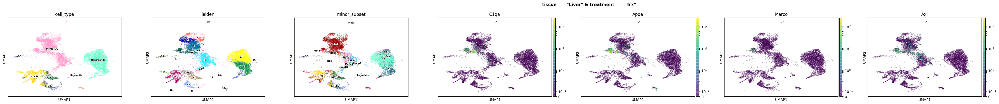

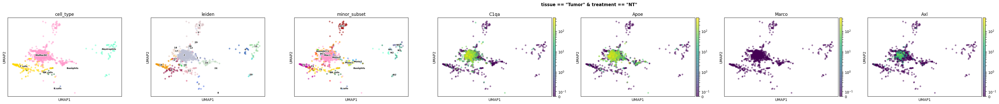

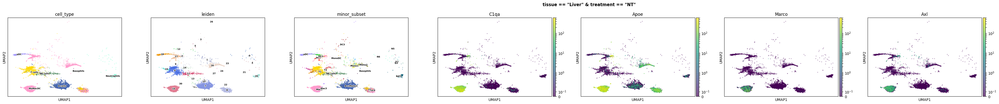

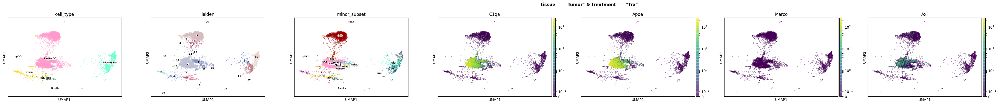

In [10]:
start = time()
fig_mac_genes = ng.umap_plot(adata, folder='figures/leiden_annotation/macrophages', color=['cell_type', 'leiden', 'minor_subset', *mac_genes], return_fig=True, save_fig=True, alpha=0.5, ncols=7, split_by_cats=['tissue', 'treatment'])
print(time() - start)

# DC benchmarking

Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.


figures/leiden_annotation/dendritic/tissue_Liver_treatment_Trx_by_cell_type_leiden_minor_subset_Flt3_Tbc1d4_Ccr7_200417_02h42_1.pdf done!


Trying to set attribute `.uns` of view, copying.


figures/leiden_annotation/dendritic/tissue_Tumor_treatment_NT_by_cell_type_leiden_minor_subset_Flt3_Tbc1d4_Ccr7_200417_02h42_2.pdf done!


Trying to set attribute `.uns` of view, copying.


figures/leiden_annotation/dendritic/tissue_Liver_treatment_NT_by_cell_type_leiden_minor_subset_Flt3_Tbc1d4_Ccr7_200417_02h42_3.pdf done!
figures/leiden_annotation/dendritic/tissue_Tumor_treatment_Trx_by_cell_type_leiden_minor_subset_Flt3_Tbc1d4_Ccr7_200417_02h42_4.pdf done!
30.725237131118774


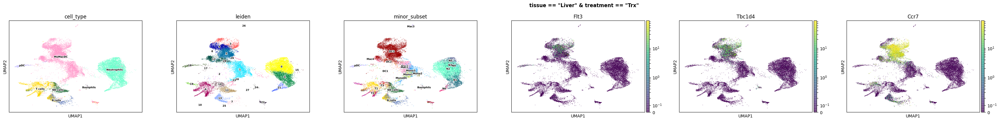

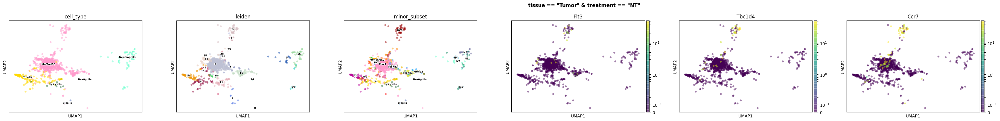

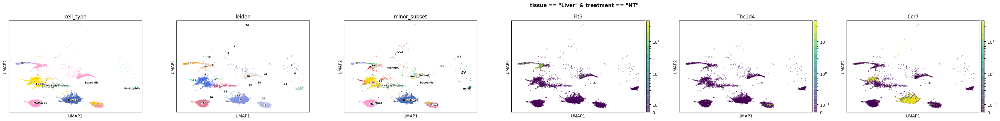

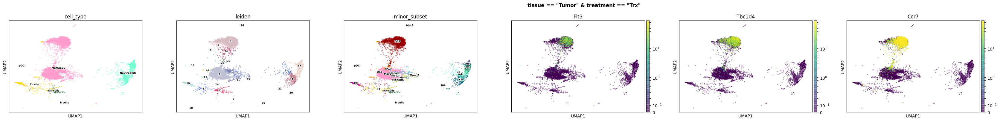

In [11]:
start = time()
fig_dc_genes = ng.umap_plot(adata, folder='figures/leiden_annotation/dendritic', color=['cell_type', 'leiden', 'minor_subset', *dc_genes], return_fig=True, save_fig=True, alpha=0.5, ncols=7, split_by_cats=['tissue', 'treatment'])
print(time() - start)

# KC benchmarking

Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.


figures/leiden_annotation/kupffer/tissue_Liver_treatment_Trx_by_cell_type_leiden_minor_subset_Timd4_Clec4f_Adgre1_200417_02h43_1.pdf done!


Trying to set attribute `.uns` of view, copying.


figures/leiden_annotation/kupffer/tissue_Tumor_treatment_NT_by_cell_type_leiden_minor_subset_Timd4_Clec4f_Adgre1_200417_02h43_2.pdf done!


Trying to set attribute `.uns` of view, copying.


figures/leiden_annotation/kupffer/tissue_Liver_treatment_NT_by_cell_type_leiden_minor_subset_Timd4_Clec4f_Adgre1_200417_02h43_3.pdf done!
figures/leiden_annotation/kupffer/tissue_Tumor_treatment_Trx_by_cell_type_leiden_minor_subset_Timd4_Clec4f_Adgre1_200417_02h43_4.pdf done!
29.78529381752014


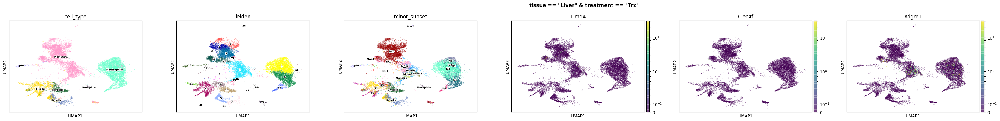

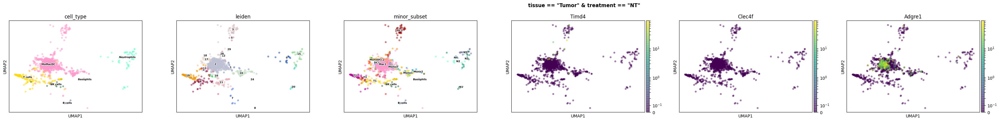

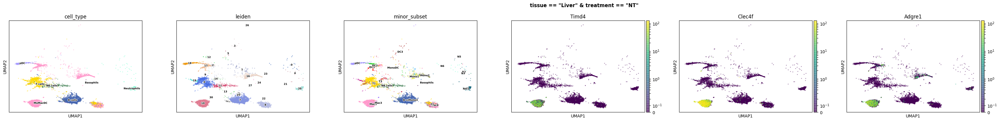

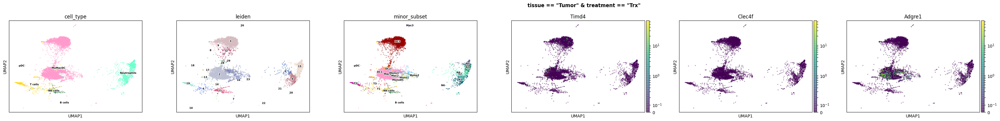

In [12]:
start = time()
fig_kc_genes = ng.umap_plot(adata, folder='figures/leiden_annotation/kupffer', color=['cell_type', 'leiden', 'minor_subset', *kc_genes], return_fig=True, save_fig=True, alpha=0.5, ncols=7, split_by_cats=['tissue', 'treatment'])
print(time() - start)

# B cell benchmarking

Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.


figures/leiden_annotation/bcells/tissue_Liver_treatment_Trx_by_cell_type_leiden_minor_subset_Cd19_200417_02h43_1.pdf done!


Trying to set attribute `.uns` of view, copying.


figures/leiden_annotation/bcells/tissue_Tumor_treatment_NT_by_cell_type_leiden_minor_subset_Cd19_200417_02h43_2.pdf done!


Trying to set attribute `.uns` of view, copying.


figures/leiden_annotation/bcells/tissue_Liver_treatment_NT_by_cell_type_leiden_minor_subset_Cd19_200417_02h43_3.pdf done!
figures/leiden_annotation/bcells/tissue_Tumor_treatment_Trx_by_cell_type_leiden_minor_subset_Cd19_200417_02h43_4.pdf done!
19.537022352218628


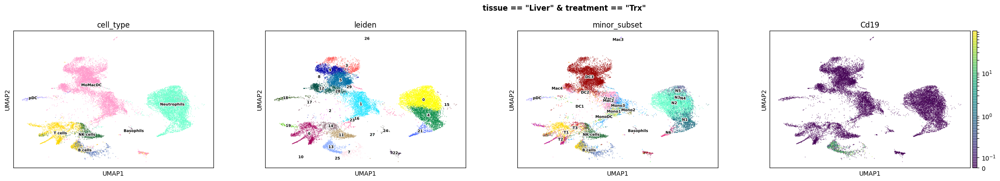

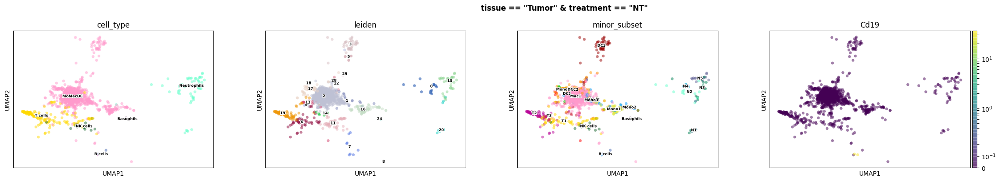

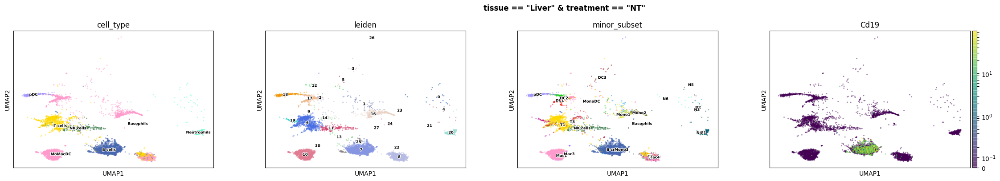

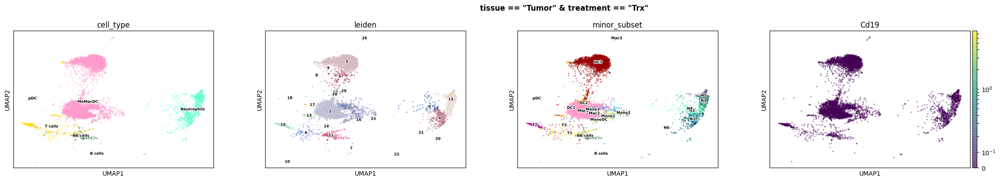

In [13]:
start = time()
fig_bc_genes = ng.umap_plot(adata, folder='figures/leiden_annotation/bcells', color=['cell_type', 'leiden', 'minor_subset', *bc_genes], return_fig=True, save_fig=True, alpha=0.5, ncols=7, split_by_cats=['tissue', 'treatment'])
print(time() - start)

# T cell benchmarking

Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.


figures/leiden_annotation/tcells/tissue_Liver_treatment_Trx_by_cell_type_leiden_minor_subset_Cd3g_Cd3d_Cd28_200417_02h44_1.pdf done!


Trying to set attribute `.uns` of view, copying.


figures/leiden_annotation/tcells/tissue_Tumor_treatment_NT_by_cell_type_leiden_minor_subset_Cd3g_Cd3d_Cd28_200417_02h44_2.pdf done!


Trying to set attribute `.uns` of view, copying.


figures/leiden_annotation/tcells/tissue_Liver_treatment_NT_by_cell_type_leiden_minor_subset_Cd3g_Cd3d_Cd28_200417_02h44_3.pdf done!
figures/leiden_annotation/tcells/tissue_Tumor_treatment_Trx_by_cell_type_leiden_minor_subset_Cd3g_Cd3d_Cd28_200417_02h44_4.pdf done!
29.855016946792603


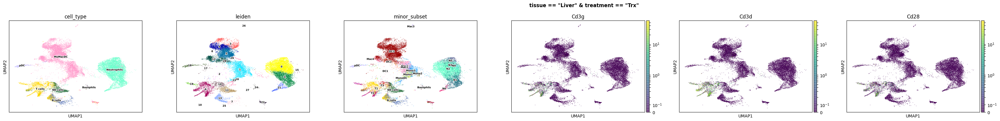

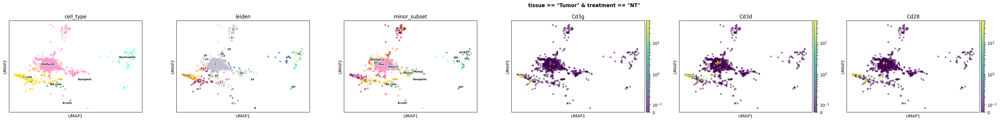

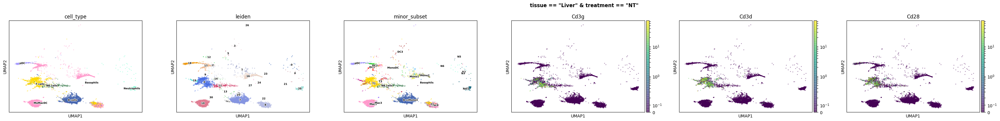

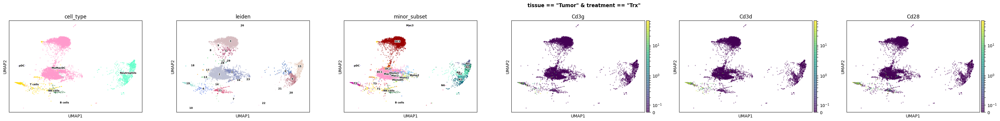

In [14]:
start = time()
fig_tc_genes = ng.umap_plot(adata, folder='figures/leiden_annotation/tcells', color=['cell_type', 'leiden', 'minor_subset', *tc_genes], return_fig=True, save_fig=True, alpha=0.5, ncols=7, split_by_cats=['tissue', 'treatment'])
print(time() - start)

# Cytotoxic T cell benchmarking

Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.


figures/leiden_annotation/cd8t/tissue_Liver_treatment_Trx_by_cell_type_leiden_minor_subset_Klrg1_Cd8a_200417_02h44_1.pdf done!


Trying to set attribute `.uns` of view, copying.


figures/leiden_annotation/cd8t/tissue_Tumor_treatment_NT_by_cell_type_leiden_minor_subset_Klrg1_Cd8a_200417_02h44_2.pdf done!


Trying to set attribute `.uns` of view, copying.


figures/leiden_annotation/cd8t/tissue_Liver_treatment_NT_by_cell_type_leiden_minor_subset_Klrg1_Cd8a_200417_02h45_3.pdf done!
figures/leiden_annotation/cd8t/tissue_Tumor_treatment_Trx_by_cell_type_leiden_minor_subset_Klrg1_Cd8a_200417_02h45_4.pdf done!
24.26480531692505


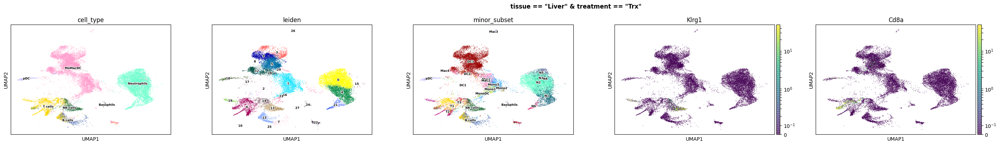

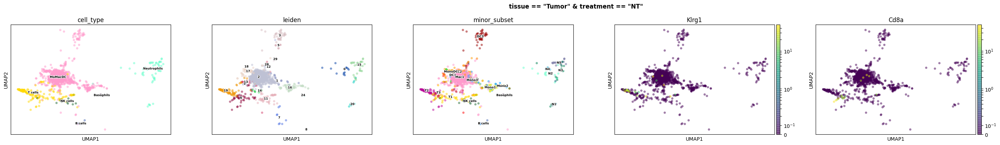

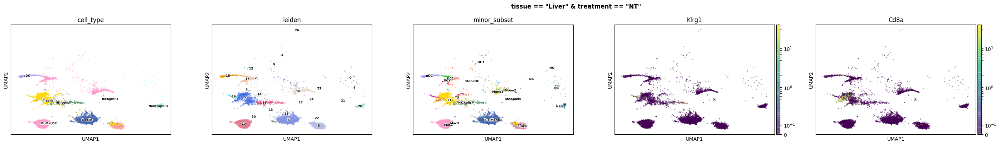

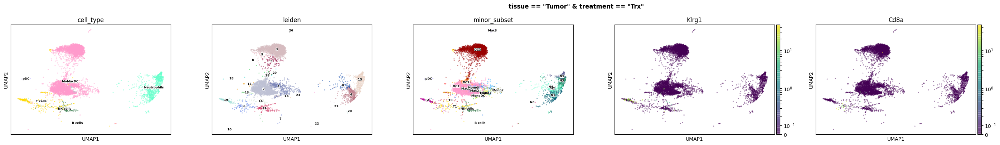

In [16]:
start = time()
fig_cd8t_genes = ng.umap_plot(adata, folder='figures/leiden_annotation/cd8t', color=['cell_type', 'leiden', 'minor_subset', *cd8t_genes], return_fig=True, save_fig=True, alpha=0.5, ncols=7, split_by_cats=['tissue', 'treatment'])
print(time() - start)

# T helper cell benchmarking

Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.


figures/leiden_annotation/thelper/tissue_Liver_treatment_Trx_by_cell_type_leiden_minor_subset_Cd4_200417_02h46_1.pdf done!


Trying to set attribute `.uns` of view, copying.


figures/leiden_annotation/thelper/tissue_Tumor_treatment_NT_by_cell_type_leiden_minor_subset_Cd4_200417_02h46_2.pdf done!


Trying to set attribute `.uns` of view, copying.


figures/leiden_annotation/thelper/tissue_Liver_treatment_NT_by_cell_type_leiden_minor_subset_Cd4_200417_02h46_3.pdf done!
figures/leiden_annotation/thelper/tissue_Tumor_treatment_Trx_by_cell_type_leiden_minor_subset_Cd4_200417_02h46_4.pdf done!
18.99437189102173


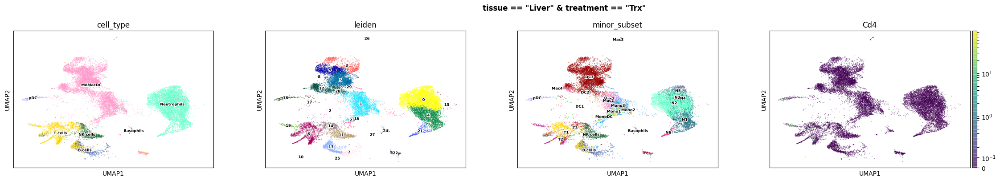

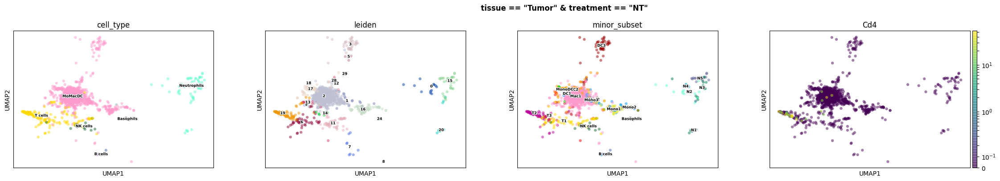

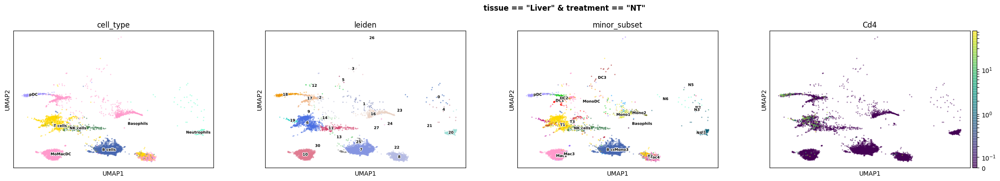

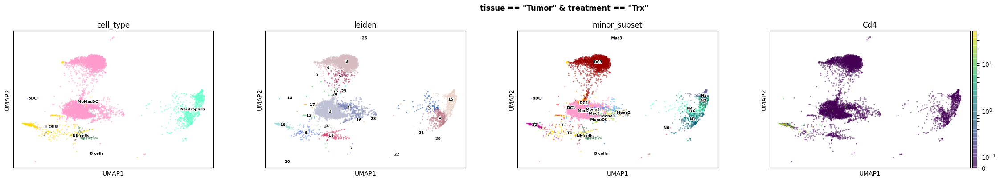

In [18]:
start = time()
fig_th_genes = ng.umap_plot(adata, folder='figures/leiden_annotation/thelper', color=['cell_type', 'leiden', 'minor_subset', *th_genes], return_fig=True, save_fig=True, alpha=0.5, ncols=7, split_by_cats=['tissue', 'treatment'])
print(time() - start)

# NK cell benchmarking

Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.


figures/leiden_annotation/nk/tissue_Liver_treatment_Trx_by_cell_type_leiden_minor_subset_Klrb1_Cd69_200417_03h02_1.pdf done!


/home/ng136/miniconda3/envs/py36/lib/python3.6/site-packages/scanpy/plotting/_tools/scatterplots.py:972: UserWarning: Attempting to set identical left == right == 0.0 results in singular transformations; automatically expanding.
  pl.colorbar(cax, ax=ax, pad=0.01, fraction=0.08, aspect=30)
/home/ng136/miniconda3/envs/py36/lib/python3.6/site-packages/scanpy/plotting/_tools/scatterplots.py:972: UserWarning: Attempting to set identical bottom == top == 0.0 results in singular transformations; automatically expanding.
  pl.colorbar(cax, ax=ax, pad=0.01, fraction=0.08, aspect=30)
Trying to set attribute `.uns` of view, copying.


figures/leiden_annotation/nk/tissue_Tumor_treatment_NT_by_cell_type_leiden_minor_subset_Klrb1_Cd69_200417_03h02_2.pdf done!


Trying to set attribute `.uns` of view, copying.


figures/leiden_annotation/nk/tissue_Liver_treatment_NT_by_cell_type_leiden_minor_subset_Klrb1_Cd69_200417_03h02_3.pdf done!


/home/ng136/miniconda3/envs/py36/lib/python3.6/site-packages/scanpy/plotting/_tools/scatterplots.py:972: UserWarning: Attempting to set identical left == right == 0.0 results in singular transformations; automatically expanding.
  pl.colorbar(cax, ax=ax, pad=0.01, fraction=0.08, aspect=30)
/home/ng136/miniconda3/envs/py36/lib/python3.6/site-packages/scanpy/plotting/_tools/scatterplots.py:972: UserWarning: Attempting to set identical bottom == top == 0.0 results in singular transformations; automatically expanding.
  pl.colorbar(cax, ax=ax, pad=0.01, fraction=0.08, aspect=30)


figures/leiden_annotation/nk/tissue_Tumor_treatment_Trx_by_cell_type_leiden_minor_subset_Klrb1_Cd69_200417_03h02_4.pdf done!
28.350203275680542


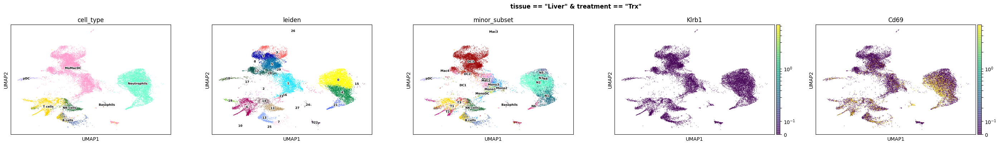

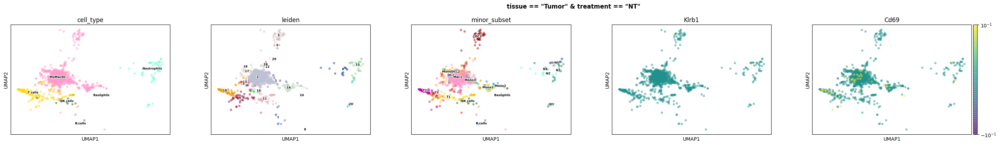

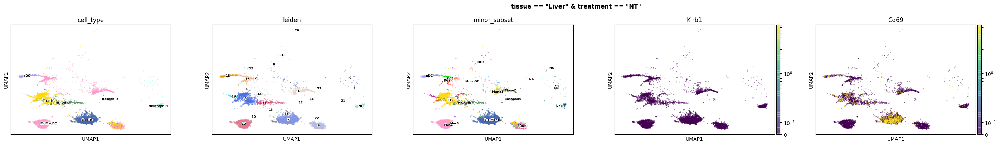

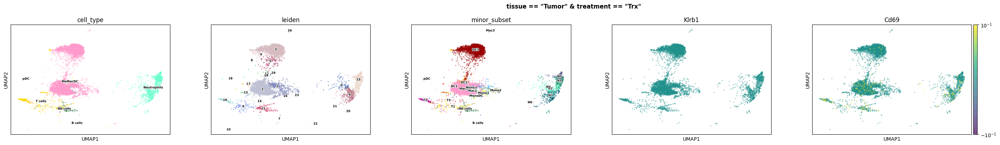

In [23]:
start = time()
fig_nk_genes = ng.umap_plot(adata, folder='figures/leiden_annotation/nk', color=['cell_type', 'leiden', 'minor_subset', *nk_genes], return_fig=True, save_fig=True, alpha=0.5, ncols=7, split_by_cats=['tissue', 'treatment'])
print(time() - start)

# Neutrophils benchmarking

Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.


figures/leiden_annotation/neutrophils/tissue_Liver_treatment_Trx_by_cell_type_leiden_minor_subset_Ly6g_200417_02h47_1.pdf done!


/home/ng136/miniconda3/envs/py36/lib/python3.6/site-packages/scanpy/plotting/_tools/scatterplots.py:972: UserWarning: Attempting to set identical left == right == 0.0 results in singular transformations; automatically expanding.
  pl.colorbar(cax, ax=ax, pad=0.01, fraction=0.08, aspect=30)
/home/ng136/miniconda3/envs/py36/lib/python3.6/site-packages/scanpy/plotting/_tools/scatterplots.py:972: UserWarning: Attempting to set identical bottom == top == 0.0 results in singular transformations; automatically expanding.
  pl.colorbar(cax, ax=ax, pad=0.01, fraction=0.08, aspect=30)
Trying to set attribute `.uns` of view, copying.


figures/leiden_annotation/neutrophils/tissue_Tumor_treatment_NT_by_cell_type_leiden_minor_subset_Ly6g_200417_02h47_2.pdf done!


Trying to set attribute `.uns` of view, copying.


figures/leiden_annotation/neutrophils/tissue_Liver_treatment_NT_by_cell_type_leiden_minor_subset_Ly6g_200417_02h47_3.pdf done!
figures/leiden_annotation/neutrophils/tissue_Tumor_treatment_Trx_by_cell_type_leiden_minor_subset_Ly6g_200417_02h47_4.pdf done!
19.600117683410645


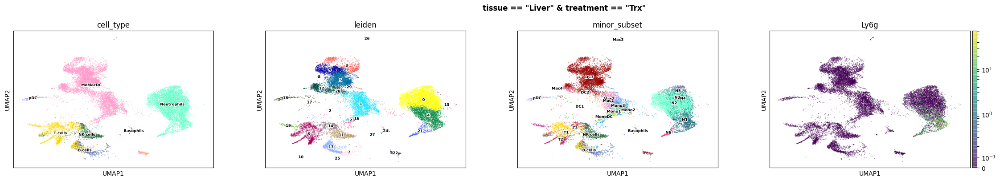

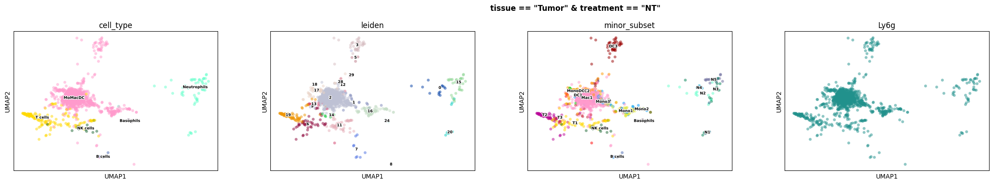

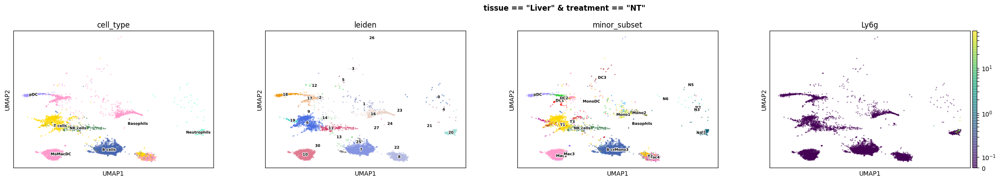

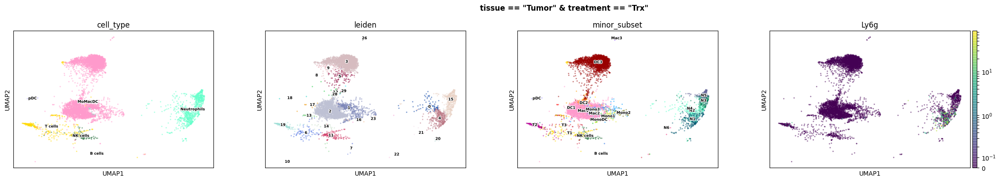

In [21]:
start = time()
fig_neu_genes = ng.umap_plot(adata, folder='figures/leiden_annotation/neutrophils', color=['cell_type', 'leiden', 'minor_subset', *neu_genes], return_fig=True, save_fig=True, alpha=0.5, ncols=7, split_by_cats=['tissue', 'treatment'])
print(time() - start)

# T cell benchmarking

In [ ]:
start = time()
fig_tc_genes = ng.umap_plot(adata, folder='figures/leiden_annotation/tc', color=['cell_type', 'leiden', 'minor_subset', *neu_genes], return_fig=True, save_fig=True, alpha=0.5, ncols=7, split_by_cats=['tissue', 'treatment'])
print(time() - start)

In [ ]:
ng.umap_plot(adata, folder='figures/leiden_annotation', color=['Il12b', 'Batf3', 'leiden'], return_fig=True, save_fig=False, alpha=0.5, ncols=3, split_by_cats=['tissue', 'treatment'])


In [ ]:
ng.umap_plot(adata, folder='figures/leiden_annotation', color=['minor_subset', 'leiden', 'Cd19'], return_fig=True, save_fig=False, alpha=0.5, ncols=4, split_by_cats=['tissue', 'treatment'])


In [ ]:
'Cd3a' in adata.var_names

In [ ]:
ng.umap_plot(adata, folder='figures/leiden_annotation', color=['minor_subset', 'leiden', 'Cd19'], return_fig=True, save_fig=False, alpha=0.5, ncols=4, split_by_cats=['tissue', 'treatment'])
 